In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Total frames extracted: 751


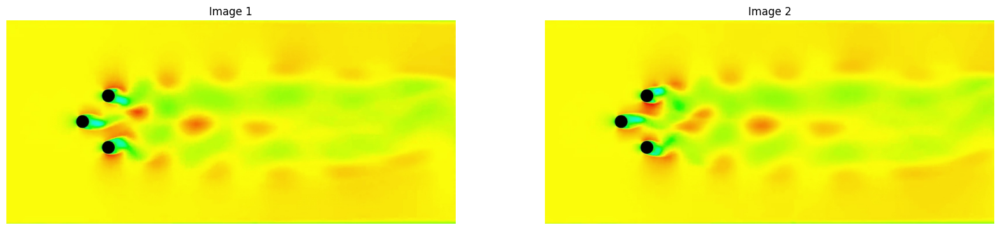

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import random
import numpy as np

def video_to_frames(video_path, output_folder, scale_factor=1.0, downsample_factor=1):

    if not os.path.exists(output_folder):
        os.makedirs(output_folder)


    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    frames = []
    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break


        if scale_factor != 1.0:
            frame = cv2.resize(frame, None, fx=scale_factor, fy=scale_factor)


        if frame_count % downsample_factor == 0:

            frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            frames.append(frame_gray)

        frame_count += 1

    print(f"Total frames extracted: {frame_count}")


    cap.release()
    cv2.destroyAllWindows()

    frames_array = np.array(frames)

    return frames_array


def plot_images_from_folder(folder_path, num_images):

    image_files = [file for file in os.listdir(folder_path) if file.endswith('.jpg')]


    selected_images = random.sample(image_files, num_images)


    plt.figure(figsize=(20, 10))
    for i, image_name in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_name)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.title(f"Image {i+1}")
        plt.axis('off')
    plt.show()

downsample_factor = 5

scale_factor = 0.5

video_path = "/content/drive/MyDrive/3CYL_Flow.mp4"


output_folder = "/content/drive/MyDrive/Output Frames"

# Convert video to frames
frames_array_1 = video_to_frames(video_path, output_folder,scale_factor,downsample_factor)

# Plot some of the images
plot_images_from_folder(output_folder, num_images=2)


In [ ]:
import numpy as np

def apply_pod_on_frames(frames_array, num_modes):
    # Reshape frames for batch processing
    num_frames, height, width = frames_array.shape
    flattened_frames = frames_array.reshape(num_frames, -1)

    # Apply SVD
    U, S, Vt = np.linalg.svd(flattened_frames, full_matrices=False)

    # Reduce dimensions
    reduced_frames = np.dot(U[:, :num_modes], np.diag(S[:num_modes])).dot(Vt[:num_modes, :])

    # Reshape frames back to original shape
    reconstructed_frames = reduced_frames.reshape(num_frames, height, width)

    # Compute POD modes
    pod_modes = U.T

    return reconstructed_frames,pod_modes,S

# Number of modes
num_modes = 50  # You can adjust this value according to your requirement

# Apply PCA on frames
reconstructed_frames, pod_modes,S = apply_pod_on_frames(frames_array_1, num_modes)


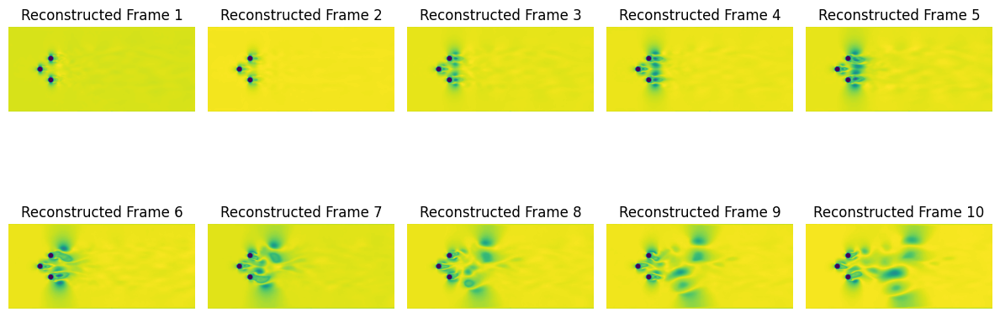

In [ ]:
import matplotlib.pyplot as plt

# Plot reconstructed frames
num_reconstructed_frames = 10  # Number of reconstructed frames to plot

plt.figure(figsize=(12, 6))
for i in range(num_reconstructed_frames):
    plt.subplot(2, num_reconstructed_frames//2, i+1)
    plt.imshow(reconstructed_frames[i], cmap=None)  # Use 'gray' colormap for grayscale images
    plt.title(f"Reconstructed Frame {i+1}")
    plt.axis('off')
plt.tight_layout()
plt.show()

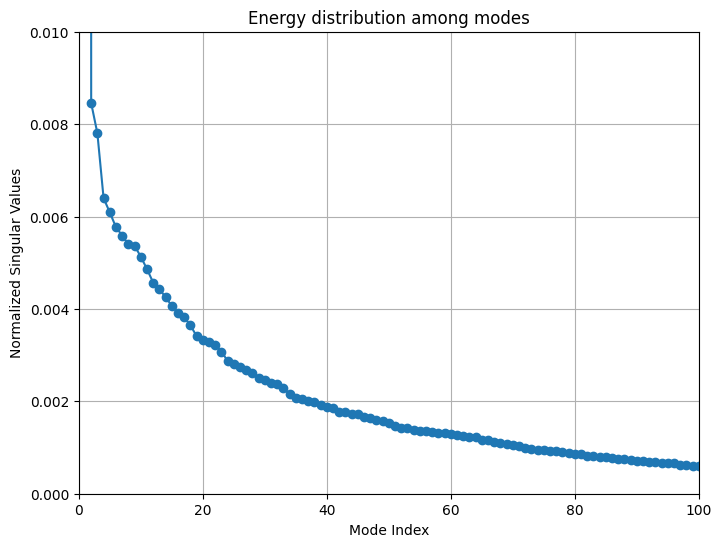

In [ ]:
import matplotlib.pyplot as plt

def plot_normalized_singular_values(S):
    # Normalize the singular values
    normalized_singular_values = S / np.sum(S)

    # Mode indices
    modes = np.arange(1, len(S) + 1)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.plot(modes, normalized_singular_values, marker='o', linestyle='-')
    plt.xlabel('Mode Index')
    plt.ylabel('Normalized Singular Values')
    plt.title('Energy distribution among modes')
    plt.xlim(0, 100)  # Set x-axis limits
    plt.ylim(0, 0.01)  # Set y-axis limits
    plt.grid(True)
    plt.show()

# Plot normalized singular values
plot_normalized_singular_values(S)


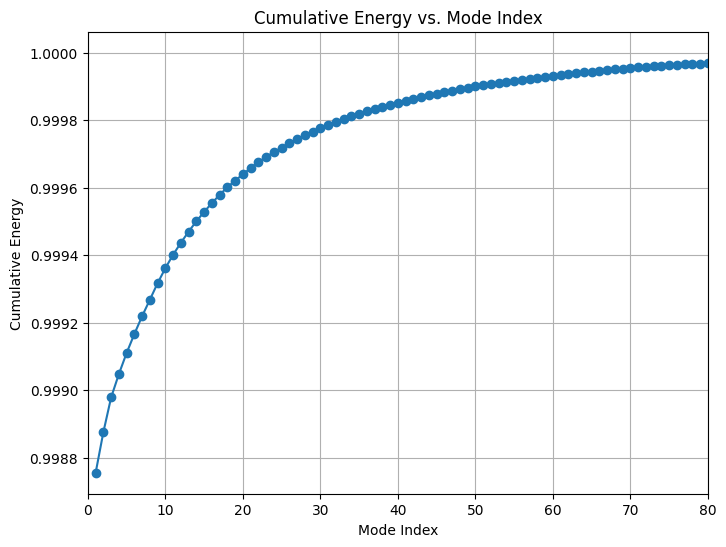

In [ ]:
import matplotlib.pyplot as plt

def plot_cumulative_energy(S):
    # Calculate cumulative energy
    total_energy = np.sum(S ** 2)
    cumulative_energy = np.cumsum(S ** 2) / total_energy

    # Mode indices
    modes = np.arange(1, len(S) + 1)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.plot(modes, cumulative_energy, marker='o', linestyle='-')
    plt.xlabel('Mode Index')
    plt.ylabel('Cumulative Energy')
    plt.title('Cumulative Energy vs. Mode Index')
    plt.xlim(0, 80)
    plt.grid(True)
    plt.show()

# Plot cumulative energy
plot_cumulative_energy(S)


In [ ]:
top_modes_indices = np.argsort(S)[::-1][:10]
top_modes_energy = S
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")


Top 10 energy states (modes):
Mode 1: Energy = 1389855.7888
Mode 2: Energy = 15281.7996
Mode 3: Energy = 14098.9214
Mode 4: Energy = 11564.6143
Mode 5: Energy = 11004.7393
Mode 6: Energy = 10425.4821
Mode 7: Energy = 10098.4669
Mode 8: Energy = 9757.55
Mode 9: Energy = 9699.6359
Mode 10: Energy = 9274.3514


In [ ]:
import numpy as np
import random

def add_gaussian_noise(image, magnitude):
    mean = 0
    std_dev = magnitude * np.max(image)
    noise = np.random.normal(mean, std_dev, image.shape)
    noisy_image = np.clip(image + noise, 0, 255)
    return noisy_image.astype(np.uint8)

def add_salt_and_pepper_noise(image, magnitude):
    noisy_image = np.copy(image)
    num_salt = np.ceil(magnitude * image.size * 0.5)
    num_pepper = np.ceil(magnitude * image.size * 0.5)

    # Add salt noise
    coords = [np.random.randint(0, i-1, int(num_salt)) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 255

    # Add pepper noise
    coords = [np.random.randint(0, i-1, int(num_pepper)) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 0

    return noisy_image.astype(np.uint8)

def add_speckle_noise(image, magnitude):
    noise = magnitude * np.random.randn(*image.shape)
    noisy_image = np.clip(image + image * noise, 0, 255)
    return noisy_image.astype(np.uint8)

# Add noise to frames
def add_noise_to_frames(frames, noise_type, magnitudes):
    noisy_frames = []
    for magnitude in magnitudes:
        noisy_magnitude_frames = []
        for frame in frames:
            if noise_type == 'gaussian':
                noisy_frame = add_gaussian_noise(frame, magnitude)
            elif noise_type == 'salt_and_pepper':
                noisy_frame = add_salt_and_pepper_noise(frame, magnitude)
            elif noise_type == 'speckle':
                noisy_frame = add_speckle_noise(frame, magnitude)
            noisy_magnitude_frames.append(noisy_frame)
        noisy_frames.append(noisy_magnitude_frames)
    return noisy_frames

# Magnitudes of noise to be added
magnitudes = [0.2, 0.4, 0.6, 0.8]

# Add different types of noise separately to the original frames
gaussian_noisy_frames = add_noise_to_frames(frames_array_1, 'gaussian', magnitudes)
salt_and_pepper_noisy_frames = add_noise_to_frames(frames_array_1, 'salt_and_pepper', magnitudes)
speckle_noisy_frames = add_noise_to_frames(frames_array_1, 'speckle', magnitudes)


In [ ]:
# Apply POD on noisy images
reconstructed_frames_gaussian = []
reconstructed_frames_salt_and_pepper = []
reconstructed_frames_speckle = []

pod_modes_gaussian = []
pod_modes_salt_and_pepper = []
pod_modes_speckle = []

# Apply POD on frames with Gaussian noise
for noisy_magnitude_frames in gaussian_noisy_frames:
    reconstructed_frames, pod_modes, S1 = apply_pod_on_frames(np.array(noisy_magnitude_frames),num_modes)
    reconstructed_frames_gaussian.append(reconstructed_frames)
    pod_modes_gaussian.append(pod_modes)

# Apply POD on frames with salt and pepper noise
for noisy_magnitude_frames in salt_and_pepper_noisy_frames:
    reconstructed_frames, pod_modes, S2 = apply_pod_on_frames(np.array(noisy_magnitude_frames),num_modes)
    reconstructed_frames_salt_and_pepper.append(reconstructed_frames)
    pod_modes_salt_and_pepper.append(pod_modes)

# Apply POD on frames with speckle noise
for noisy_magnitude_frames in speckle_noisy_frames:
    reconstructed_frames, pod_modes, S3 = apply_pod_on_frames(np.array(noisy_magnitude_frames),num_modes)
    reconstructed_frames_speckle.append(reconstructed_frames)
    pod_modes_speckle.append(pod_modes)


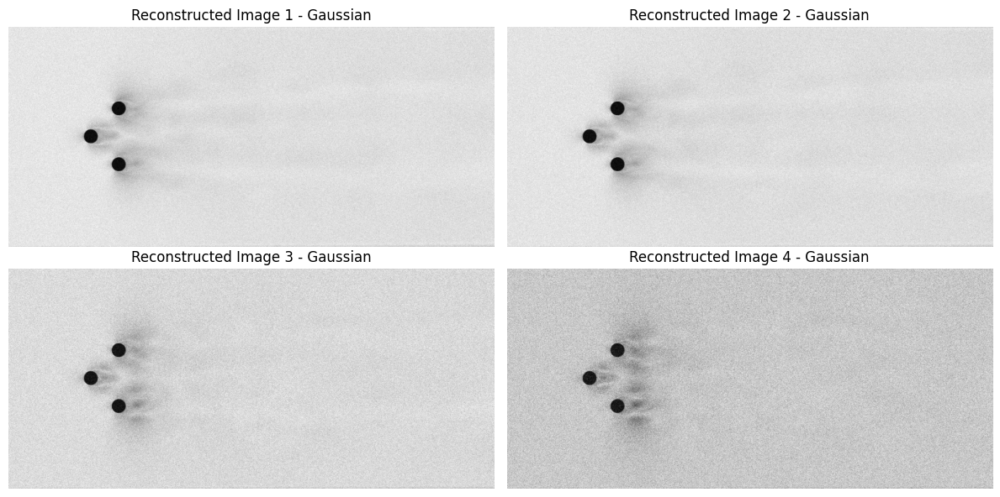

In [ ]:
import matplotlib.pyplot as plt

def plot_reconstructed_images(reconstructed_frames, noise_type, num_reconstructed_frames):
    plt.figure(figsize=(12, 6))
    for i in range(num_reconstructed_frames):
        plt.subplot(2, num_reconstructed_frames // 2, i+1)
        plt.imshow(reconstructed_frames[i], cmap='gray')
        plt.title(f"Reconstructed Image {i+1} - {noise_type.capitalize()}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Number of reconstructed frames to plot
num_reconstructed_frames = 4

# Plot reconstructed images for Gaussian noise
plot_reconstructed_images(reconstructed_frames_gaussian[0], 'gaussian', num_reconstructed_frames)

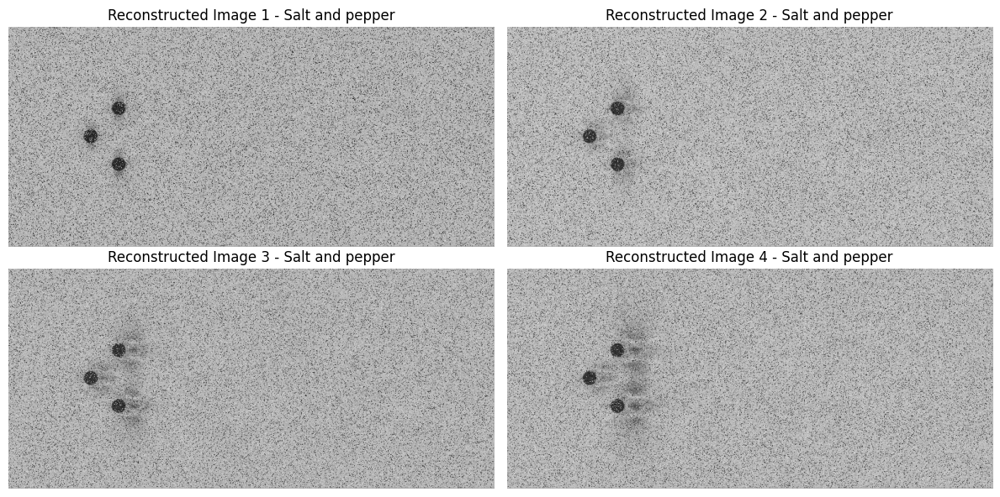

In [ ]:
# Plot reconstructed images for Salt and Pepper noise
plot_reconstructed_images(reconstructed_frames_salt_and_pepper[0], 'salt and pepper', num_reconstructed_frames)

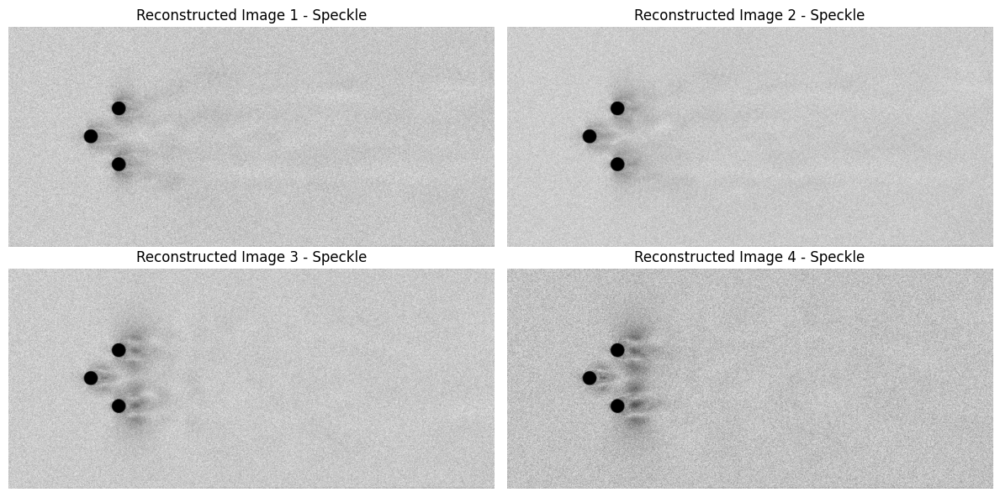

In [ ]:
# Plot reconstructed images for Speckle noise
plot_reconstructed_images(reconstructed_frames_speckle[0], 'speckle', num_reconstructed_frames)

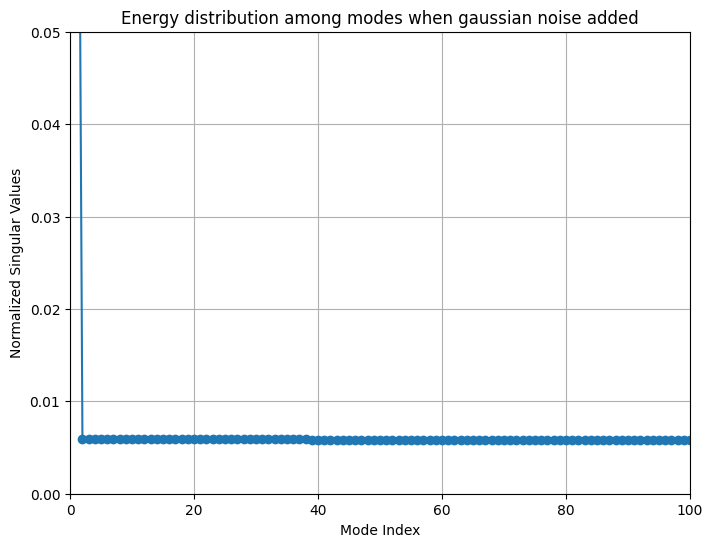

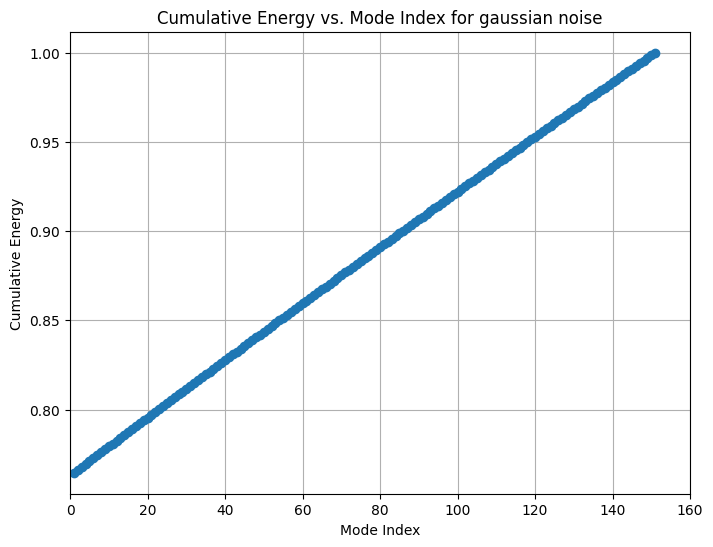

In [ ]:
import matplotlib.pyplot as plt

def plot_normalized_singular_values(S):
    # Normalize the singular values
    normalized_singular_values = S / np.sum(S)

    # Mode indices
    modes = np.arange(1, len(S) + 1)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.plot(modes, normalized_singular_values, marker='o', linestyle='-')
    plt.xlabel('Mode Index')
    plt.ylabel('Normalized Singular Values')
    plt.title('Energy distribution among modes when gaussian noise added')
    plt.xlim(0, 100)  # Set x-axis limits
    plt.ylim(0, 0.05)  # Set y-axis limits
    plt.grid(True)
    plt.show()

# Plot normalized singular values
plot_normalized_singular_values(S1)

def plot_cumulative_energy(S):
    # Calculate cumulative energy
    total_energy = np.sum(S ** 2)
    cumulative_energy = np.cumsum(S ** 2) / total_energy

    # Mode indices
    modes = np.arange(1, len(S) + 1)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.plot(modes, cumulative_energy, marker='o', linestyle='-')
    plt.xlabel('Mode Index')
    plt.ylabel('Cumulative Energy')
    plt.title('Cumulative Energy vs. Mode Index for gaussian noise')
    plt.xlim(0, 160)
    plt.grid(True)
    plt.show()

# Plot cumulative energy
plot_cumulative_energy(S1)


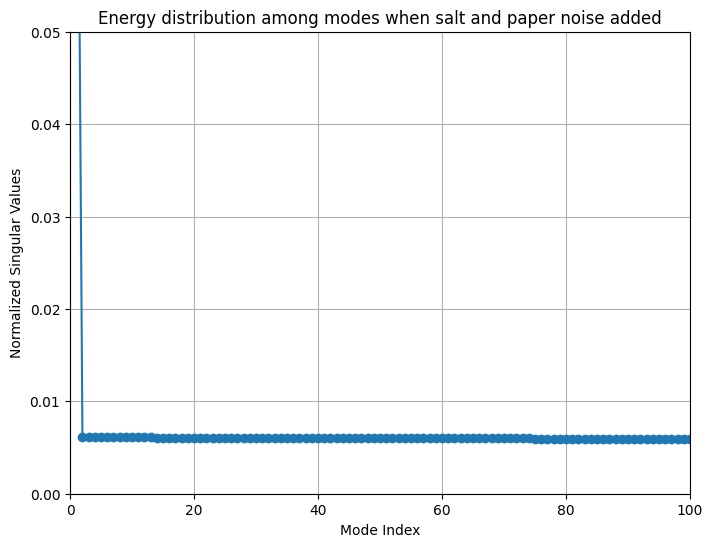

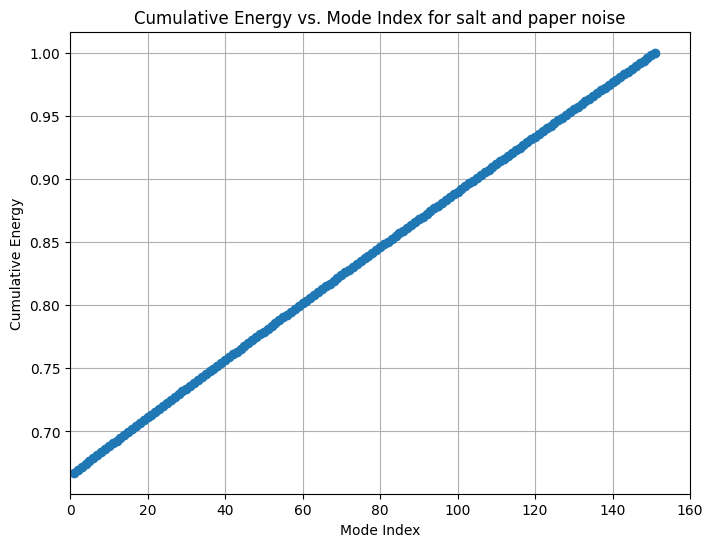

In [ ]:
import matplotlib.pyplot as plt

def plot_normalized_singular_values(S):
    # Normalize the singular values
    normalized_singular_values = S / np.sum(S)

    # Mode indices
    modes = np.arange(1, len(S) + 1)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.plot(modes, normalized_singular_values, marker='o', linestyle='-')
    plt.xlabel('Mode Index')
    plt.ylabel('Normalized Singular Values')
    plt.title('Energy distribution among modes when salt and paper noise added')
    plt.xlim(0, 100)  # Set x-axis limits
    plt.ylim(0, 0.05)  # Set y-axis limits
    plt.grid(True)
    plt.show()

# Plot normalized singular values
plot_normalized_singular_values(S2)

def plot_cumulative_energy(S):
    # Calculate cumulative energy
    total_energy = np.sum(S ** 2)
    cumulative_energy = np.cumsum(S ** 2) / total_energy

    # Mode indices
    modes = np.arange(1, len(S) + 1)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.plot(modes, cumulative_energy, marker='o', linestyle='-')
    plt.xlabel('Mode Index')
    plt.ylabel('Cumulative Energy')
    plt.title('Cumulative Energy vs. Mode Index for salt and paper noise')
    plt.xlim(0, 160)
    plt.grid(True)
    plt.show()

# Plot cumulative energy
plot_cumulative_energy(S2)


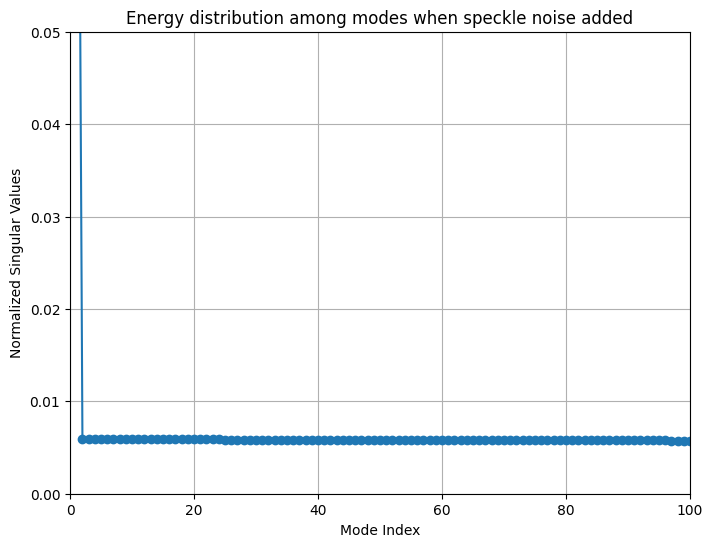

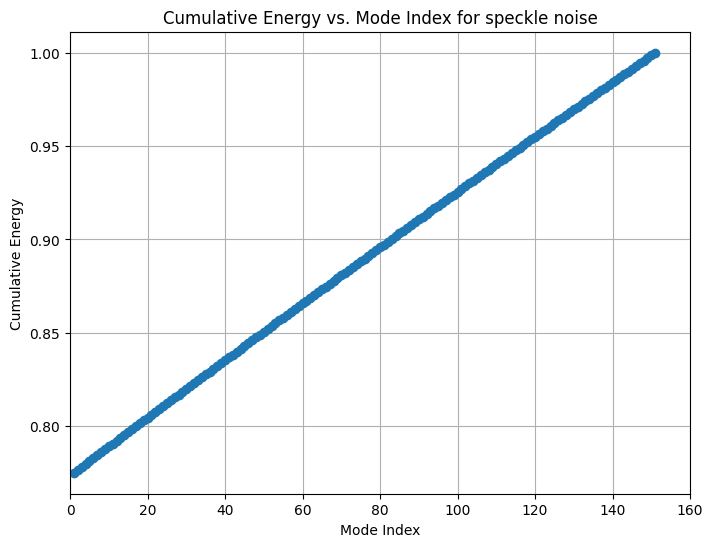

In [ ]:
import matplotlib.pyplot as plt

def plot_normalized_singular_values(S):
    # Normalize the singular values
    normalized_singular_values = S / np.sum(S)

    # Mode indices
    modes = np.arange(1, len(S) + 1)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.plot(modes, normalized_singular_values, marker='o', linestyle='-')
    plt.xlabel('Mode Index')
    plt.ylabel('Normalized Singular Values')
    plt.title('Energy distribution among modes when speckle noise added')
    plt.xlim(0, 100)  # Set x-axis limits
    plt.ylim(0, 0.05)  # Set y-axis limits
    plt.grid(True)
    plt.show()

# Plot normalized singular values
plot_normalized_singular_values(S3)

def plot_cumulative_energy(S):
    # Calculate cumulative energy
    total_energy = np.sum(S ** 2)
    cumulative_energy = np.cumsum(S ** 2) / total_energy

    # Mode indices
    modes = np.arange(1, len(S) + 1)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.plot(modes, cumulative_energy, marker='o', linestyle='-')
    plt.xlabel('Mode Index')
    plt.ylabel('Cumulative Energy')
    plt.title('Cumulative Energy vs. Mode Index for speckle noise')
    plt.xlim(0, 160)
    plt.grid(True)
    plt.show()

# Plot cumulative energy
plot_cumulative_energy(S3)


In [ ]:
import numpy as np

# Function to denoise frames using PCA
def denoise_frames_with_pca(frames, num_components):
    denoised_frames = []
    for magnitude_frames in frames:
        magnitude_denoised_frames = []
        for frame in magnitude_frames:
            # Flatten the frame
            flattened_frame = frame.flatten()

            # Apply PCA
            U, S, Vt = np.linalg.svd(flattened_frame[np.newaxis, :], full_matrices=False)
            reduced_frame = np.dot(U[:, :num_components], np.dot(np.diag(S[:num_components]), Vt[:num_components, :]))

            # Reshape the frame back to its original shape
            denoised_frame = reduced_frame.reshape(frame.shape)
            magnitude_denoised_frames.append(denoised_frame)
        denoised_frames.append(magnitude_denoised_frames)
    return denoised_frames

num_components = 50
# Denoise frames with Gaussian noise using PCA
denoised_frames_gaussian_pca = denoise_frames_with_pca(reconstructed_frames_gaussian, num_components)

# Denoise frames with salt and pepper noise using PCA
denoised_frames_salt_and_pepper_pca = denoise_frames_with_pca(reconstructed_frames_salt_and_pepper, num_components)

# Denoise frames with speckle noise using PCA
denoised_frames_speckle_pca = denoise_frames_with_pca(reconstructed_frames_speckle, num_components)


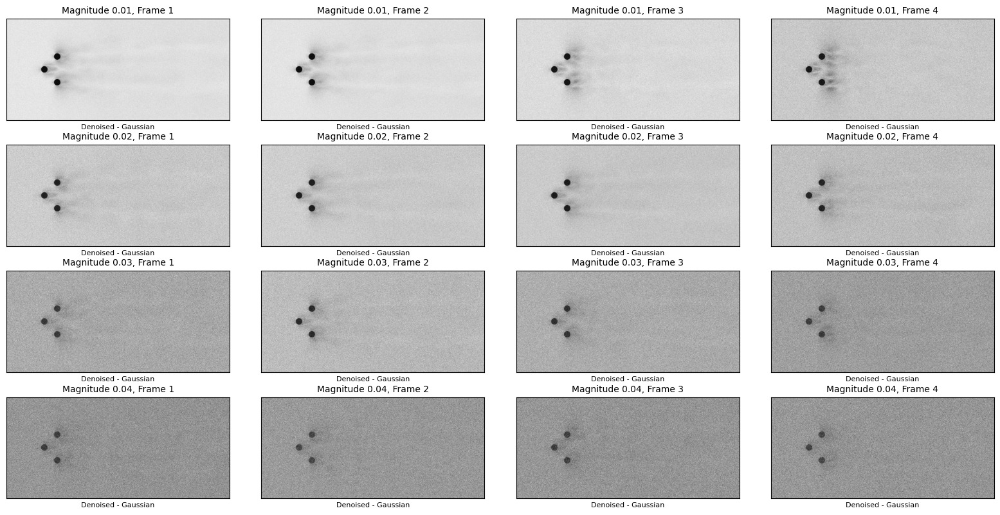

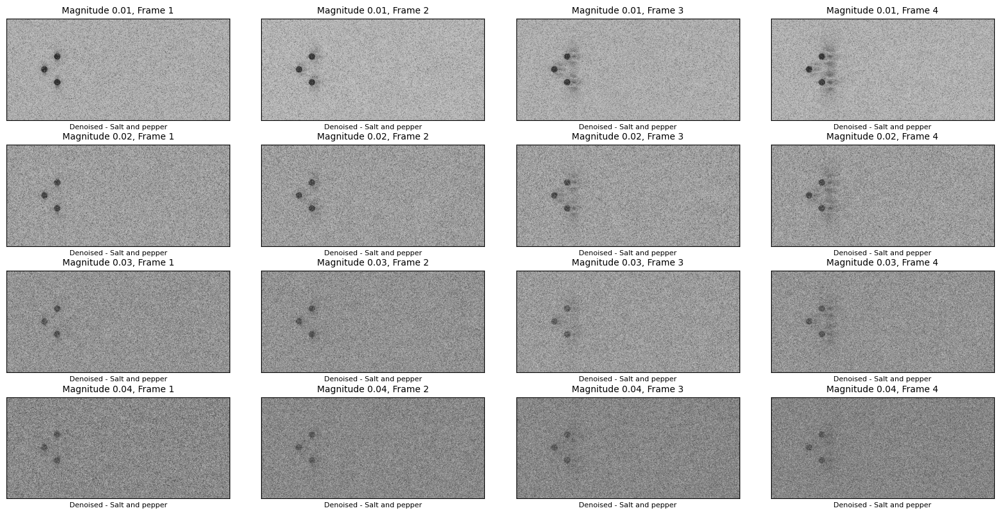

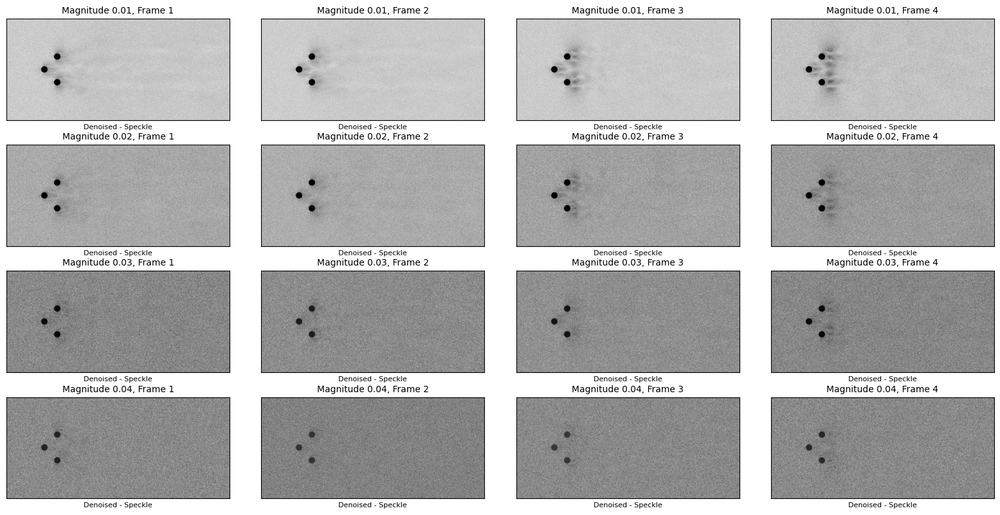

In [ ]:
import matplotlib.pyplot as plt

# Function to plot denoised frames
def plot_denoised_frames(denoised_frames, noise_type, num_magnitudes, num_frames):
    plt.figure(figsize=(16, 8))
    for i in range(num_magnitudes):
        for j in range(num_frames):
            plt.subplot(num_magnitudes, num_frames, i * num_frames + j + 1)
            plt.imshow(denoised_frames[i][j], cmap='gray')  # Assuming grayscale images
            plt.title(f"Magnitude {(i+1)/100}, Frame {j+1}", fontsize=10)
            plt.xlabel(f"Denoised - {noise_type.capitalize()}", fontsize=8)
            plt.xticks([])
            plt.yticks([])
    plt.tight_layout()
    plt.show()

# Number of magnitudes and frames to plot
num_magnitudes = len(denoised_frames_gaussian_pca)
num_frames = min(len(denoised_frames_gaussian_pca[0]), 4)  # Assuming at most 4 frames per magnitude

# Plot denoised frames with Gaussian noise using PCA
plot_denoised_frames(denoised_frames_gaussian_pca, 'gaussian', num_magnitudes, num_frames)

# Plot denoised frames with salt and pepper noise using PCA
plot_denoised_frames(denoised_frames_salt_and_pepper_pca, 'salt and pepper', num_magnitudes, num_frames)

# Plot denoised frames with speckle noise using PCA
plot_denoised_frames(denoised_frames_speckle_pca, 'speckle', num_magnitudes, num_frames)


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Define CNN architecture for denoising
def denoising_cnn(input_shape):
    model = models.Sequential([
        layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')
    ])
    return model

# Define loss function (Mean Squared Error)
loss_fn = tf.keras.losses.MeanSquaredError()

# Function to denoise frames using CNN
def denoise_frames_with_cnn(frames):
    # Assuming frames is a list of numpy arrays containing the reconstructed frames
    denoised_frames = []
    for magnitude_frames in frames:
        magnitude_denoised_frames = []
        for frame in magnitude_frames:
            # Assuming grayscale images, add channel dimension
            frame = frame[..., np.newaxis]
            # Denoise frame using CNN
            denoised_frame = model.predict(frame[np.newaxis, ...])
            magnitude_denoised_frames.append(denoised_frame.squeeze())
        denoised_frames.append(magnitude_denoised_frames)
    return denoised_frames

# Create CNN model
height, width = frames_array_1.shape[1:]  # Assuming frames_array_1 is the array of original frames
model = denoising_cnn((height, width, 1))  # Assuming grayscale images
model.compile(optimizer='adam', loss=loss_fn)

# Denoise frames with Gaussian noise using CNN
denoised_frames_gaussian = denoise_frames_with_cnn(reconstructed_frames_gaussian)

# Denoise frames with salt and pepper noise using CNN
denoised_frames_salt_and_pepper = denoise_frames_with_cnn(reconstructed_frames_salt_and_pepper)

# Denoise frames with speckle noise using CNN
denoised_frames_speckle = denoise_frames_with_cnn(reconstructed_frames_speckle)


1/1 [==============================] - 1s 1s/step


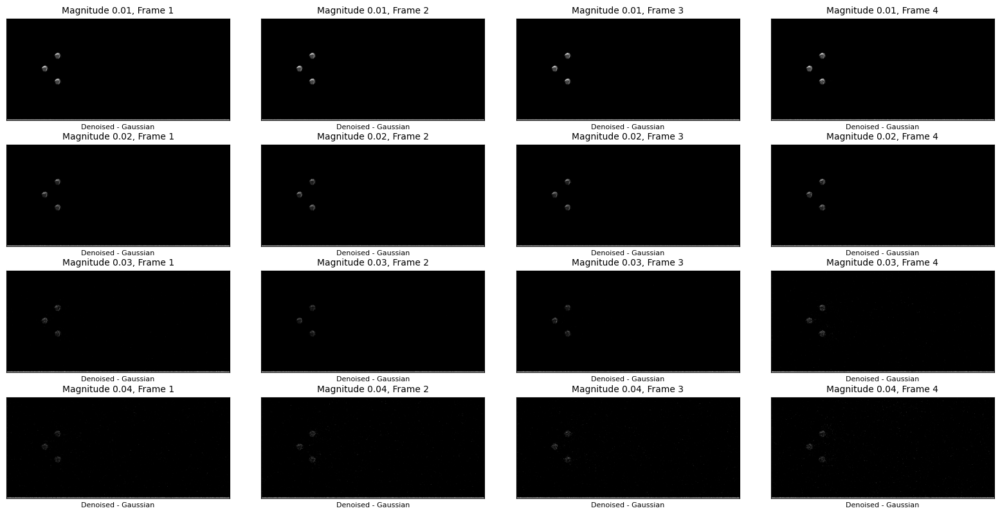

In [ ]:
import matplotlib.pyplot as plt

# Function to plot denoised frames
def plot_denoised_frames(denoised_frames, noise_type, num_magnitudes, num_frames):
    plt.figure(figsize=(16, 8))
    for i in range(num_magnitudes):
        for j in range(num_frames):
            plt.subplot(num_magnitudes, num_frames, i * num_frames + j + 1)
            plt.imshow(denoised_frames[i][j], cmap='gray')  # Assuming grayscale images
            plt.title(f"Magnitude {(i+1)/100}, Frame {j+1}", fontsize=10)
            plt.xlabel(f"Denoised - {noise_type.capitalize()}", fontsize=8)
            plt.xticks([])
            plt.yticks([])
    plt.tight_layout()
    plt.show()

# Number of magnitudes and frames to plot
num_magnitudes = len(denoised_frames_gaussian)
num_frames = min(len(denoised_frames_gaussian[0]), 4)  # Assuming at most 4 frames per magnitude

# Plot denoised frames with Gaussian noise
plot_denoised_frames(denoised_frames_gaussian, 'gaussian', num_magnitudes, num_frames)

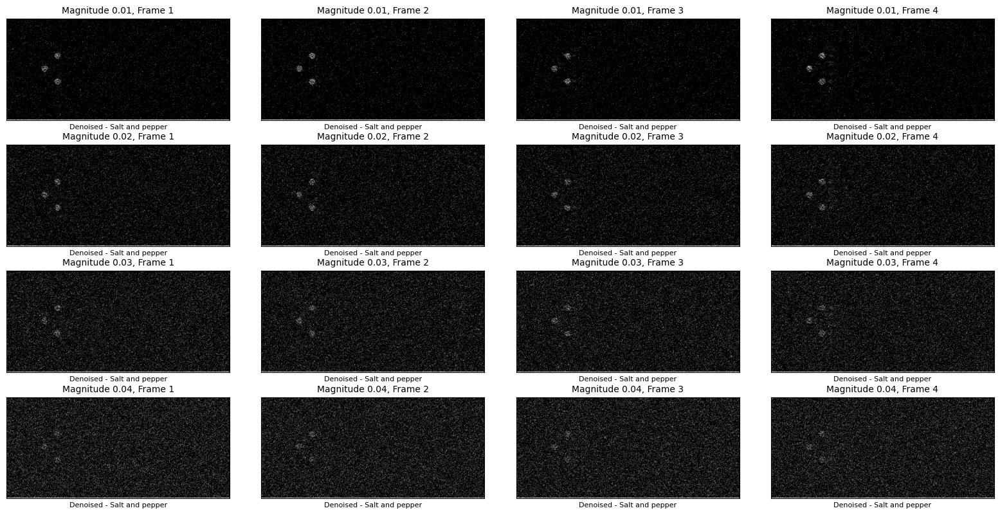

In [ ]:
# Plot denoised frames with salt and pepper noise
plot_denoised_frames(denoised_frames_salt_and_pepper, 'salt and pepper', num_magnitudes, num_frames)

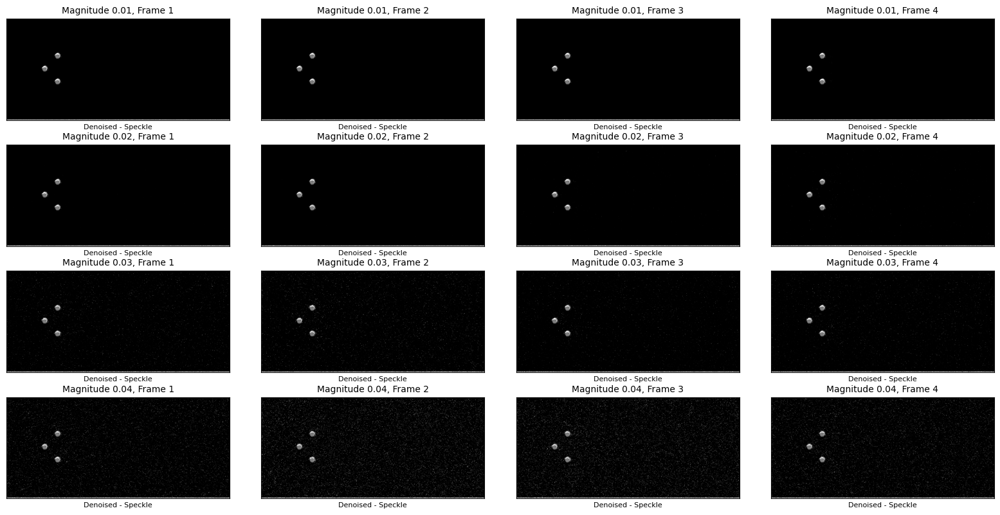

In [ ]:
# Plot denoised frames with speckle noise
plot_denoised_frames(denoised_frames_speckle, 'speckle', num_magnitudes, num_frames)

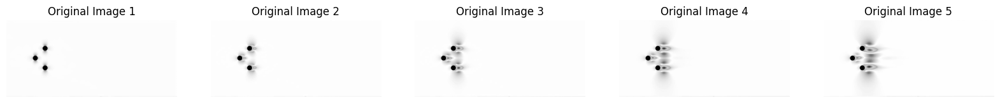

In [ ]:
import matplotlib.pyplot as plt

def plot_original_images(frames_array, num_images):
    # Plot original images
    plt.figure(figsize=(20, 10))
    for i in range(num_images):
        plt.subplot(1, num_images, i+1)
        plt.imshow(frames_array[i], cmap='gray')  # Assuming grayscale images
        plt.title(f"Original Image {i+1}")
        plt.axis('off')
    plt.show()

# Plot original images
plot_original_images(frames_array_1, num_images=5)
